# <center>Telecom Churn Prediction Using ANN</center>

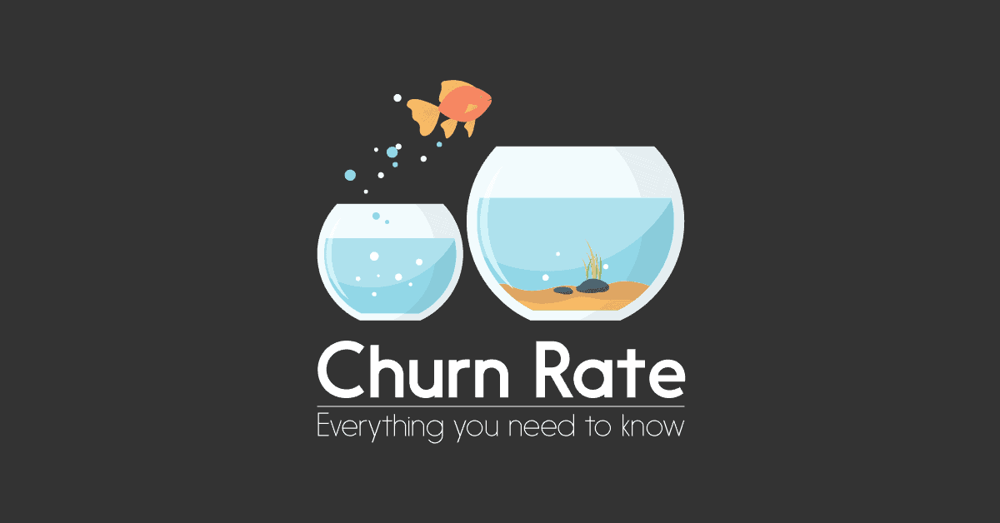

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
train=pd.read_csv('/kaggle/input/telecom-churn-datasets/churn-bigml-80.csv')
test=pd.read_csv('/kaggle/input/telecom-churn-datasets/churn-bigml-20.csv')
train.shape

(2666, 20)

In [3]:
train.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


# EDA

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [5]:
train.duplicated().sum()

0

In [6]:
train['Churn'].value_counts()

False    2278
True      388
Name: Churn, dtype: int64

In [7]:
train['State'].value_counts()

WV    88
MN    70
NY    68
VA    67
AL    66
OH    66
WY    66
OR    62
NV    61
WI    61
MD    60
UT    60
CO    59
CT    59
MI    58
VT    57
ID    56
NC    56
TX    55
FL    54
IN    54
MT    53
OK    52
MA    52
KS    52
MO    51
DE    51
NJ    50
SC    49
SD    49
ME    49
GA    49
RI    48
MS    48
WA    48
AR    47
IL    45
DC    45
AZ    45
NE    45
HI    44
NM    44
ND    44
AK    43
KY    43
NH    43
TN    41
IA    38
PA    36
LA    35
CA    24
Name: State, dtype: int64

In [8]:
train.corr()

/tmp/ipykernel_20/2189804198.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  train.corr()


,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
Account length,1.000000,-0.008620,-0.002996,0.002847,0.038862,0.002843,-0.015923,0.018552,-0.015909,-0.008994,-0.024007,-0.008999,0.011369,0.017627,0.011383,0.002455,0.017728
Area code,-0.008620,1.000000,-0.000584,-0.023134,-0.009629,-0.023130,0.000679,-0.018602,0.000707,-0.003353,0.011455,-0.003382,-0.013418,-0.027423,-0.013534,0.034442,0.001019
Number vmail messages,-0.002996,-0.000584,1.000000,0.019027,-0.009622,0.019027,0.011401,0.005131,0.011418,-0.000224,0.008124,-0.000229,-0.004156,0.027013,-0.004136,-0.018787,-0.086474
Total day minutes,0.002847,-0.023134,0.019027,1.000000,0.016780,1.000000,0.003999,0.009059,0.003992,0.013491,0.015054,0.013464,-0.011042,0.005687,-0.010934,-0.024543,0.195688
Total day calls,0.038862,-0.009629,-0.009622,0.016780,1.000000,0.016787,-0.026003,0.006473,-0.026006,0.008986,-0.016776,0.008972,0.031036,0.006928,0.031133,-0.011945,0.018290
Total day charge,0.002843,-0.023130,0.019027,1.000000,0.016787,1.000000,0.004008,0.009056,0.004002,0.013495,0.015057,0.013468,-0.011046,0.005688,-0.010938,-0.024548,0.195689
Total eve minutes,-0.015923,0.000679,0.011401,0.003999,-0.026003,0.004008,1.000000,-0.007654,1.000000,-0.013414,0.009017,-0.013450,-0.006915,0.002160,-0.006947,-0.013192,0.072906
Total eve calls,0.018552,-0.018602,0.005131,0.009059,0.006473,0.009056,-0.007654,1.000000,-0.007642,-0.000175,0.000797,-0.000135,0.011012,0.003710,0.011000,0.001058,-0.001539
Total eve charge,-0.015909,0.000707,0.011418,0.003992,-0.026006,0.004002,1.000000,-0.007642,1.000000,-0.013428,0.009030,-0.013464,-0.006923,0.002169,-0.006955,-0.013196,0.072893
Total night minutes,-0.008994,-0.003353,-0.000224,0.013491,0.008986,0.013495,-0.013414,-0.000175,-0.013428,1.000000,0.012736,0.999999,-0.008607,-0.001110,-0.008510,0.005236,0.033639


/tmp/ipykernel_20/4179326460.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(train.corr(),annot=True);


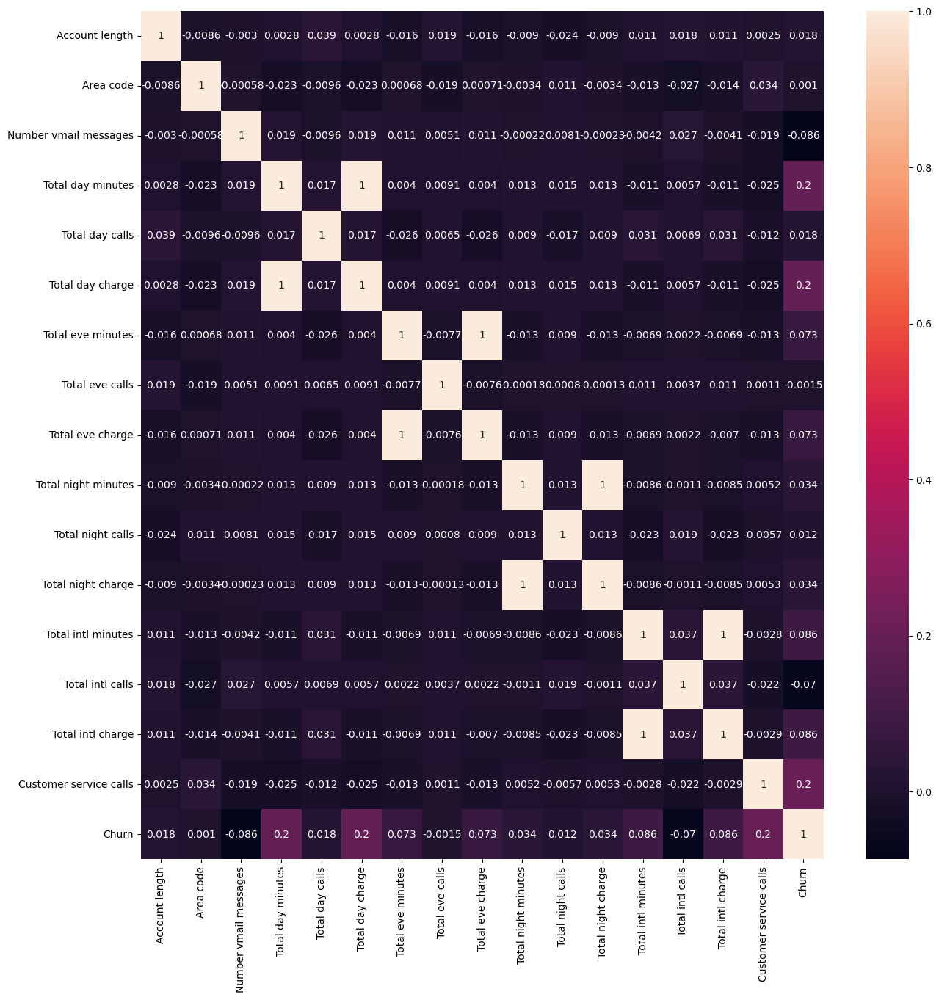

In [9]:
# Plotting Correlation
plt.figure(figsize=(15,15))
sns.heatmap(train.corr(),annot=True);

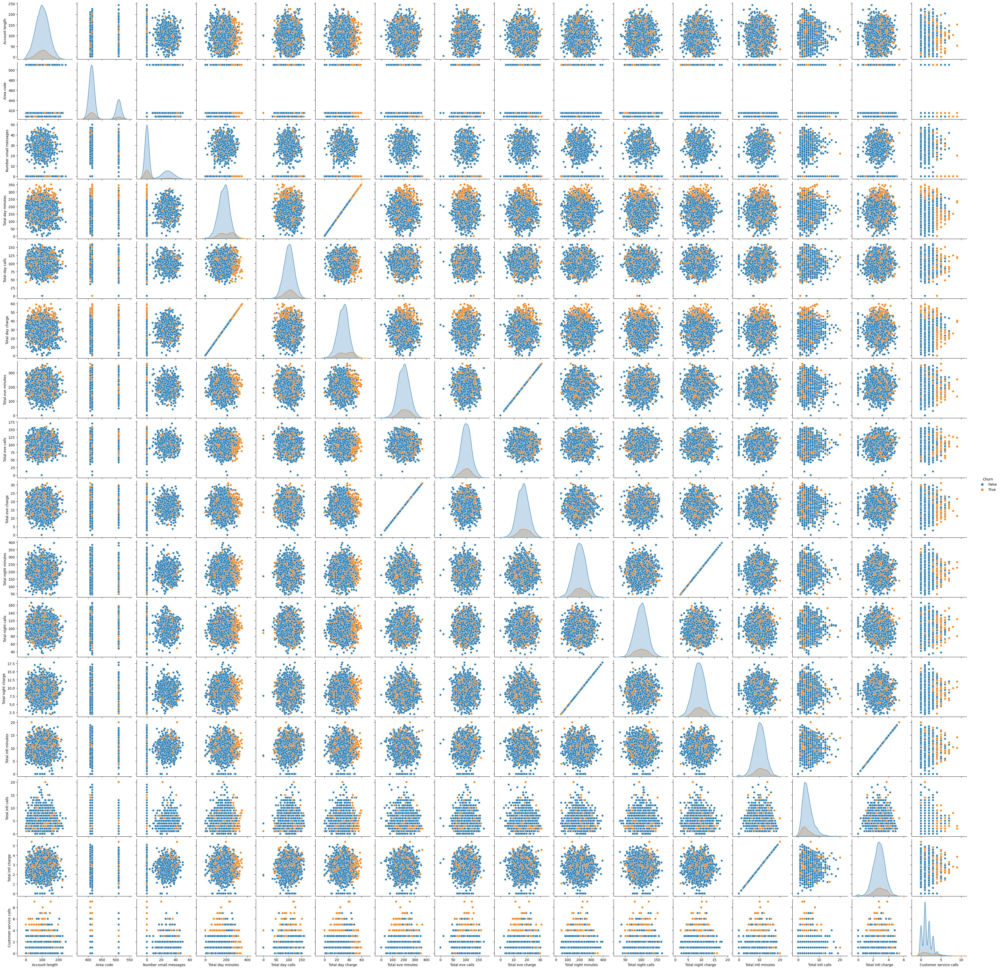

In [10]:
sns.pairplot(train,hue="Churn")

# Feature Engineering

In [11]:
# Dropping 'State' as it is irrelevent
train.drop(columns=['State'],inplace=True)
test.drop(columns=['State'],inplace=True)

In [12]:
# One-Hot Encoding
train=pd.get_dummies(train,columns=['International plan','Voice mail plan','Churn'],drop_first=True)
test=pd.get_dummies(test,columns=['International plan','Voice mail plan','Churn'],drop_first=True)

In [13]:
# Input and Output
X_train=train.drop(columns=['Churn_True'])
y_train=train['Churn_True']

X_test=test.drop(columns=['Churn_True'])
y_test=test['Churn_True']

In [14]:
X_train.shape

(2666, 18)

# Scaling

In [15]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [16]:
X_train_scaled
X_test_scaled

array([[ 0.41408044, -0.69246654, -0.58941354, ..., -0.42917241,
        -0.33569005, -0.61579486],
       [-0.90049316, -0.52781119, -0.58941354, ...,  1.85917488,
        -0.33569005, -0.61579486],
       [ 1.52641195, -0.52781119, -0.58941354, ...,  1.85917488,
        -0.33569005, -0.61579486],
       ...,
       [-1.02689446, -0.52781119, -0.58941354, ...,  1.09639245,
        -0.33569005, -0.61579486],
       [ 1.47585142, -0.52781119, -0.58941354, ..., -0.42917241,
        -0.33569005, -0.61579486],
       [ 2.10785796,  1.70679716, -0.58941354, ...,  0.33361002,
         2.97893841, -0.61579486]])

# Implementing ANN

In [17]:
import tensorflow
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [18]:
model=Sequential()

# Level 1: 3 perceptron, activation function= 'relu' taking 18 input
model.add(Dense(3,activation='relu',input_dim=18))

# Level 2: 3 perceptron, activation function= 'relu'
model.add(Dense(3,activation='relu'))

# Level 3: 1 perceptron, activation function= 'sigmoid'
model.add(Dense(1,activation='sigmoid'))

In [19]:
# Summary of Trainable Parameters
'''
here, 
    Layer 1: 18 x 3 + 3
    Layer 2: 3 x 3 + 3
    Layer 3: 3 x 1 + 1
'''
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 3)                 57        
                                                                 
 dense_1 (Dense)             (None, 3)                 12        
                                                                 
 dense_2 (Dense)             (None, 1)                 4         
                                                                 
Total params: 73
Trainable params: 73
Non-trainable params: 0
_________________________________________________________________


In [20]:
# Compilation
'''
    loss= 'binary_crossentropy' for binary classification
    optimizer= Adam
'''
model.compile(loss='binary_crossentropy',optimizer='Adam',metrics=['accuracy'])

In [21]:
# Fitting Model with 100 iteration and splitting to 80%-20% for validation
history=model.fit(X_train_scaled,y_train,epochs=100,validation_split=0.2)

Epoch 1/100
67/67 [==============================] - 2s 8ms/step - loss: 0.6708 - accuracy: 0.7997 - val_loss: 0.6425 - val_accuracy: 0.8090
Epoch 2/100
67/67 [==============================] - 0s 4ms/step - loss: 0.6117 - accuracy: 0.8527 - val_loss: 0.5895 - val_accuracy: 0.8258
Epoch 3/100
67/67 [==============================] - 0s 4ms/step - loss: 0.5529 - accuracy: 0.8621 - val_loss: 0.5395 - val_accuracy: 0.8258
Epoch 4/100
67/67 [==============================] - 0s 4ms/step - loss: 0.5004 - accuracy: 0.8616 - val_loss: 0.4960 - val_accuracy: 0.8258
Epoch 5/100
67/67 [==============================] - 0s 4ms/step - loss: 0.4548 - accuracy: 0.8616 - val_loss: 0.4608 - val_accuracy: 0.8258
Epoch 6/100
67/67 [==============================] - 0s 4ms/step - loss: 0.4187 - accuracy: 0.8616 - val_loss: 0.4352 - val_accuracy: 0.8258
Epoch 7/100
67/67 [==============================] - 0s 4ms/step - loss: 0.3941 - accuracy: 0.8616 - val_loss: 0.4199 - val_accuracy: 0.8258
Epoch 8/100
6

In [22]:
# Trained parameters in Layer 1
model.layers[0].get_weights()

[array([[-0.15288313,  0.02236892,  0.01839025],
        [-0.23016255,  0.00934482,  0.13174145],
        [ 0.03873059, -0.3843835 , -0.5172059 ],
        [ 0.7136341 ,  1.0233624 ,  0.34727675],
        [ 0.36512974,  0.08795439, -0.17493   ],
        [-0.0063864 ,  0.6390566 , -0.2657925 ],
        [-0.14139074,  0.46084237,  0.21222912],
        [ 0.27982557, -0.06556112, -0.2514598 ],
        [ 0.07026732,  0.2269387 ,  0.01478946],
        [ 0.18500848,  0.49601412,  0.07662423],
        [-0.18149339, -0.04753665,  0.06251547],
        [ 0.27904558, -0.14402589, -0.34295878],
        [ 0.41059554,  0.11339901, -0.03299558],
        [-0.21663192,  0.0582493 ,  0.2743226 ],
        [ 0.07823703,  0.01630366, -0.26102948],
        [-0.5534284 , -0.73236156, -0.6862984 ],
        [-0.79183924,  0.00215507, -0.66836345],
        [-0.50254226, -0.6599568 ,  0.55667835]], dtype=float32),
 array([ 0.94376016, -1.0807002 ,  1.4358072 ], dtype=float32)]

In [23]:
# Trained parameters in Layer 2
model.layers[1].get_weights()

[array([[ 0.67980474,  0.70828134, -0.12328458],
        [-1.0564101 ,  0.58562684, -0.9332688 ],
        [ 0.713058  , -0.15076798, -0.2714064 ]], dtype=float32),
 array([-0.01073656, -0.68641394,  0.        ], dtype=float32)]

In [24]:
# Predicting
'''
Output passsed through 'Sigmoid' function
Will be gives probability
'''
y_log = model.predict(X_test_scaled)

21/21 [==============================] - 0s 2ms/step


In [25]:
# converting Provability into 1 and 0
y_pred=np.where(y_log>0.5,1,0)

In [26]:
# Checking Accuracy
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9205397301349325

# Plotting Loss and Accuracy

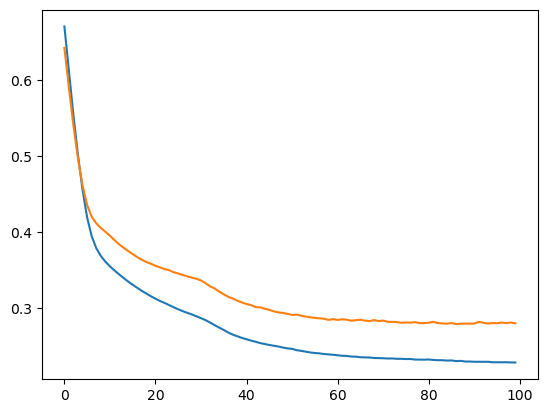

In [27]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

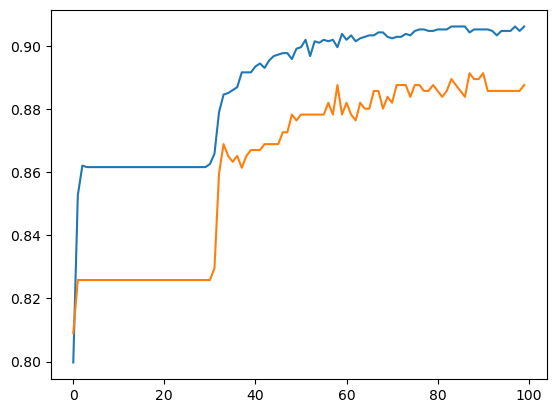

In [28]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:gray;
           font-size:110%;
           font-family:Verdana;
           letter-spacing:0.5px">

<p style="padding: 15px; color:white; text-align:center"><b>Use Regularization, Drop-Out to handle Over Fitting</b></p>
</div>